<a href="https://colab.research.google.com/github/miloszp2223/ZadanieML/blob/master/Lista6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install -U pytorch-lightning segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 857.3/857.3 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 49.5 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torchvision
import pytorch_lightning as pl
from torchvision.datasets import OxfordIIITPet
import torchvision.transforms as transforms
import torchvision.models as models
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import copy
import random
from torch import optim
from torch.utils.data import random_split
import os
from segmentation_models_pytorch.losses import DiceLoss

## Dane
Wykorzystamy zbiór [OxfordIIITPet](https://docs.pytorch.org/vision/main/generated/torchvision.datasets.OxfordIIITPet.html#oxfordiiitpet) do obu zadań, natomiast sposób ich wczytania będzie inny dla zadania segmentacji (wymaga zmiany **target_types** na "segmentation"). Do drugiej części wczytujemy obrazki jak do zadania klasyfikacji.
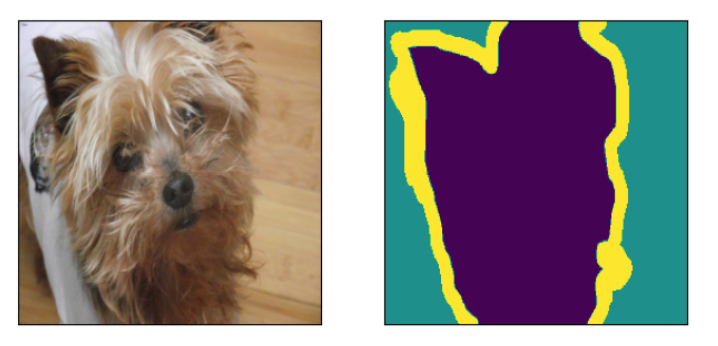



## Zadanie 0

Wczytaj zbiór OxfordIIIPet do zadania segmentacji, zbadaj co zawiera w środku oraz wyświetl przykładową maskę.

100%|██████████| 792M/792M [00:35<00:00, 22.0MB/s]
100%|██████████| 19.2M/19.2M [00:01<00:00, 10.3MB/s]


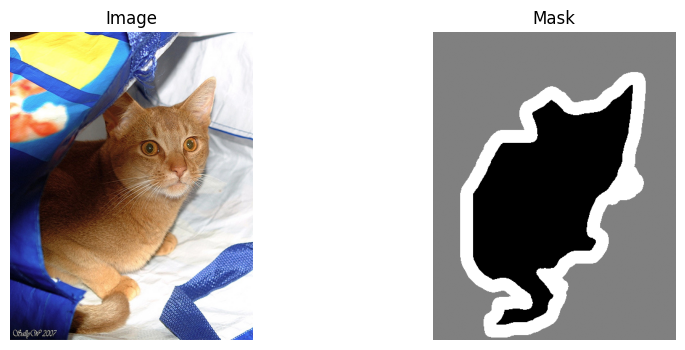

37
['Abyssinian', 'American Bulldog', 'American Pit Bull Terrier', 'Basset Hound', 'Beagle', 'Bengal', 'Birman', 'Bombay', 'Boxer', 'British Shorthair', 'Chihuahua', 'Egyptian Mau', 'English Cocker Spaniel', 'English Setter', 'German Shorthaired', 'Great Pyrenees', 'Havanese', 'Japanese Chin', 'Keeshond', 'Leonberger', 'Maine Coon', 'Miniature Pinscher', 'Newfoundland', 'Persian', 'Pomeranian', 'Pug', 'Ragdoll', 'Russian Blue', 'Saint Bernard', 'Samoyed', 'Scottish Terrier', 'Shiba Inu', 'Siamese', 'Sphynx', 'Staffordshire Bull Terrier', 'Wheaten Terrier', 'Yorkshire Terrier']
torch.Size([3, 500, 394])
torch.Size([1, 500, 394])
tensor([1, 2, 3], dtype=torch.uint8)


In [3]:
image_transform = transforms.Compose([
    transforms.ToTensor()
])

mask_transform = transforms.Compose([
    transforms.PILToTensor()
])

dataset = torchvision.datasets.OxfordIIITPet(
    root="./data",
    split="trainval",
    target_types="segmentation",
    transform=image_transform,
    target_transform=mask_transform,
    download=True
)



img, mask = dataset[0]

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.title("Image")
plt.imshow(img.permute(1,2,0))
plt.axis("off")

plt.subplot(1,2,2)
plt.title("Mask")
plt.imshow(mask.squeeze(), cmap="gray")
plt.axis("off")

plt.show()
print(len(dataset.classes))
print(dataset.classes)
print(img.shape)
print(mask.shape)
print(torch.unique(mask))

In [4]:
image_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

mask_transform = transforms.Compose([
     transforms.Resize((256, 256)),
    transforms.PILToTensor()  # zwraca (1,H,W) z wartościami 1..3
])

trainval = torchvision.datasets.OxfordIIITPet(
    root="./data",
    split="trainval",
    target_types="segmentation",
    transform=image_transform,
    target_transform=mask_transform,
    download=True
)
testset = torchvision.datasets.OxfordIIITPet(
    root="./data",
    split="test",
    target_types="segmentation",
    transform=image_transform,
    target_transform=mask_transform,
    download=True
)



train_size = int(0.8 * len(trainval))
val_size   = len(trainval) - train_size
train_ds, val_ds = random_split(trainval, [train_size, val_size])

train_loader = torch.utils.data.DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2, pin_memory=True)
val_loader   = torch.utils.data.DataLoader(val_ds, batch_size=8, shuffle=False, num_workers=2, pin_memory=True)

test_loader   = torch.utils.data.DataLoader(testset, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)

## U-Net

Jest to popularna architektura która ma swój początek w zadaniu **segmentacji** biomedycznej. Do tej pory mieliśmy styczność z klasyfikacją, gdzie każdemu obrazkowi przypisywaliśmy kategorię, natomiast segmentacja polega na przypisaniu każdemu pikselowi kategorii.

Architektura składa się z enkodera i dekodera, pośredniej warstwy bottlenecka i połączeń typu skip (aka' pomost). Sieć enkodera jest klasyczną siecią konwolucyjną, w której zwiększa się liczba kanałów kosztem zmniejszenia rozdzielczości mapy. Sieć dekodera składa się z warstw *dekonwolucji*, które mają w przeciwieństwie do zwykłej konwolucji zwiększać rozdzielczość obrazka i zmniejszać liczbę kanałów. Dzięki temu końcowy wynik ma taki sam rozmiar jak wejściowy obrazek, co reprezentuje przypisanie klasy per piksel. Połączenia pomostowe służą do konkatenacji map z enkodera i dekodera, a celem jest zachowanie informacji na temat tego "co" i "gdzie" się znajduje. Dobre wytłumaczenie znajduje się [tutaj](https://www.kaggle.com/code/akshitsharma1/unet-architecture-explained-in-one-shot-tutorial).

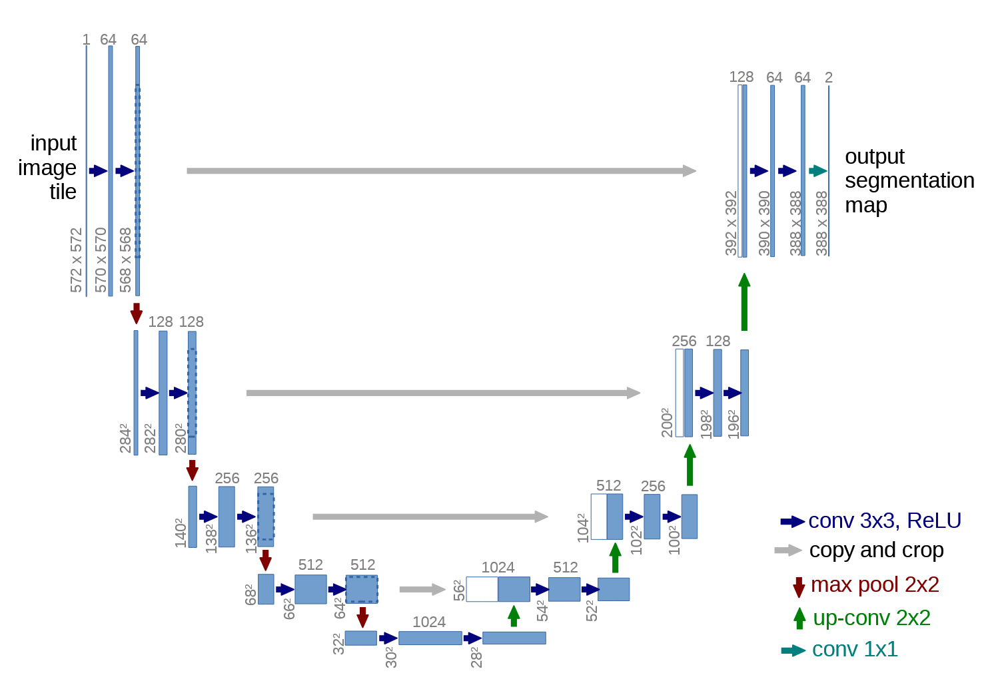

## Dekonwolucja

Dekonwolucja jest bratnią operacją konwolucji, ale jak już było wspomnianie, jej celem jest zwiększenie wymiarów przestrzennych. Składa się ona z kroków
- Upsampling: zwiększenie rozmiaru mapy zwykle dodając "puste" wiersze i kolumny
- Convolution: warstwa konwolucyjna (logiczne - czegoś też chcemy się nauczyć)
- Stride: $> 1$ zwiększa wymiar przestrzenny mapy
- Padding: to samo co w zwykłej konwolucji
- Activation: funkcja aktywacji (nieliniowa!, zwykle ReLU)

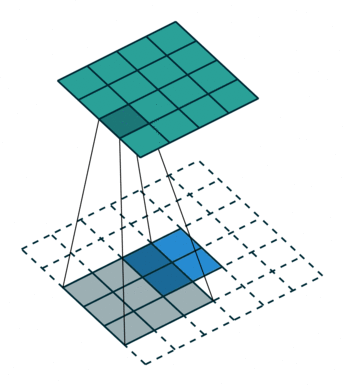

## Zadanie 1.1
Zaimplementuj blok warstwy enkodera, który będzie wykonywał m.in. operację konwolucji (zmniejszanie wymiary przestrzennego) oraz max-pooling. Jedną pułapką jest tutaj fakt, że enkoder musi zwracać dwie rzeczy - $x_{skip}$ jako wejście do dekodera, oraz $x_{down}$ po warstwie poolingu do dalszej warstwy enkodera.

$x_{skip} = ConvBlock(x)$

$x_{down} = MaxPool(x_{skip})$

gdzie $ConvBlock$ stanowi pipeline *konwolucja, batch-normalization, aktywacja* powtórzone $M$ razy (może być raz). Jest on już zaimplementowany niżej jako ```DoubleConv``` - możesz go dostosować do swoich potrzeb lub zostawić jak jest.

In [5]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, hidden_channels: int = None, stride=1):
        super().__init__()

        if not hidden_channels:
            hidden_channels = out_channels

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, hidden_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(hidden_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(hidden_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

In [6]:
class DownBlock(nn.Module): # blok budulcowy enkodera

  def __init__(self, in_channels: int, out_channels: int): # dodaj parametry
    super().__init__()

    self.conv = DoubleConv(in_channels, out_channels)
    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

  def forward(self, x): # dodaj parametry
    x_skip = self.conv(x)
    x_down = self.pool(x_skip)

    return x_skip, x_down

block = DownBlock(3, 32)

x = torch.randn(1, 3, 224, 224)
x_skip, x_down = block(x)

print(x_skip.shape)
print(x_down.shape)


torch.Size([1, 32, 224, 224])
torch.Size([1, 32, 112, 112])


## Zadanie 1.2
Zaimplementuj *blok* warstwy dekodera, która będzie wykonywała operację dekonwolucji oraz konkatenacji cech z enkodera. Przetwarzanie powinno być według schematu:

*$x_{up} = ConvTranspose(x)$

$x_{cat} = Concat(x_{up}, s)$

$y = ConvBlock(x_{out})$

Nowa warstwa dekonwolucji jest zaimplementowana w torchu [ConvTranspose2d](https://docs.pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html). Należy zwrócić uwagę na **zgodność kształtów** oraz **liczbę kanałów** (szczególnie po konkatenacji!).

*alternatywnie można użyć warswty [Upsamplingu](https://docs.pytorch.org/docs/stable/generated/torch.nn.Upsample.html) + konwolucji

In [7]:
class UpBlock(nn.Module): # blok budulcowy dekodera

  def __init__(self, in_channels: int, out_channels: int, skip_channels):
    super().__init__()
    self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)


    self.conv = DoubleConv(in_channels=out_channels + skip_channels, out_channels=out_channels)



  def forward(self, x, s): # dodaj parametry
    x_up = self.up(x)
    #print("x_up:", x_up.shape, "s:", s.shape)

    x_cat = torch.cat([x_up, s], dim=1)

    y = self.conv(x_cat)
    return y

Zalecam zrobienie krótkiego sanity-check aby sprawdzić, czy dwa bloki łączą się poprawnie

In [8]:
x = torch.randn(1, 3, 128, 128)
down_block = DownBlock(3,32) # dodaj argumenty
up_block = UpBlock(32, 16, 32) # dodaj argumenty

x_skip, x_down = down_block(x)
x_up = up_block(x_down, x_skip)

print(x_skip.shape, x_down.shape, x_up.shape)

torch.Size([1, 32, 128, 128]) torch.Size([1, 32, 64, 64]) torch.Size([1, 16, 128, 128])


## Zadanie 2.1
Następnym zadaniem jest wykorzystanie bloków do implementacji pełnej sieci. Niech nasza sieć składa się z N bloków enkodera $(E1​...En​)$, jednego bottlenecku $(B)$ i N bloków dekodera $(Dn​...D1​)$. Schemat będzie miał postać:

#### Enkoder
1. $(x1​,s1​)=E1​(input)$
2. $(x2​,s2​)=E2​(x1​)$
3. $(x3​,s3​)=E3​(x2​)$
4. $(x4​,s4​)=E4​(x3​)$

#### Bottleneck
5. $b=B(x4​)$ (zwykły blok konwolucyjny)

#### Dekoder
6. $d4​=D4​(b,s4​)$
7. $d3​=D3​(d4​,s3​)$
8. $d2​=D2​(d3​,s2​)$
9. $d1​=D1​(d2​,s1​)$

#### Spłaszczenie wyjścia
10. $output=Conv_{1x1}(d1​)$ --> wykorzystuje konwolucję $1x1$ do pozbycia się wymiaru kanału. Otrzymujemy tutaj $H \times W \times K$ predykcji (bo dla każdego piksela) i każdej klasy.

Wskazówki
- Rozmiar wejściowy: Musi być podzielny przez $2^{liczba poziomów}$ (dlaczego?), najlepiej używać potęg dwójki typu 256, 512
- Padding: równy 1
- Liczba kanałów: w enkoderze podwajamy $64 → 128 → 256$, w dekoderze dzielimy przez dwa $256 → 128 → 64$
- Konkatenacja: po wymiarze kanałów
- Wyjście: musi być takiego samo wymiary przestrzennego jak wejście, a liczba kanałów będzie odpowiadać liczbie klas.

In [9]:
class UNet(nn.Module):

  def __init__(self, in_channels=3, num_classes=1):
      super().__init__()

      # Encoder
      self.E1 = DownBlock(in_channels, 16)
      self.E2 = DownBlock(16, 32)
      self.E3 = DownBlock(32, 64)
      self.E4 = DownBlock(64, 128)

      # Bottleneck
      self.B = DoubleConv(128, 256)

      # Decoder
      self.D4 = UpBlock(256, 128, 128)
      self.D3 = UpBlock(128, 64, 64)
      self.D2 = UpBlock(64, 32, 32)
      self.D1 = UpBlock(32, 16, 16)

      # Conv 1x1 (H x W x K)
      self.out_conv = nn.Conv2d(16, num_classes, kernel_size=1)

  def forward(self, x):
      # Encoder
      s1, x1 = self.E1(x)
      s2, x2 = self.E2(x1)
      s3, x3 = self.E3(x2)
      s4, x4 = self.E4(x3)

      # Bottleneck
      b = self.B(x4)

      # Decoder
      d4 = self.D4(b, s4)
      d3 = self.D3(d4, s3)
      d2 = self.D2(d3, s2)
      d1 = self.D1(d2, s1)

      # Output
      output = self.out_conv(d1)

      return output

## Zadanie 2.2
Kolejnym krokiem jest wyuczenie sieci do zadania segmentacji. Wykorzystaj ```nn.CrossEntropyLoss``` jako funkcję straty (lub posłuż się bardziej dostosowanymi metrykami jak [Dice Loss](https://smp.readthedocs.io/en/latest/losses.html#diceloss) jeśli uczenie będzie szło bardzo źle). W tym celu konieczne będzie spłaszczenie wyniku $B \times W \times H \times K$ do $B \times (WH) \times K$. Wyświetl krzywą uczenia oraz dokładność dla każdej klasy. Dodatkowo zbieraj co $M$ epok przykładowe predykcje (dla zbioru walidacyjnego) i wyświetl jak w trakcie trenowania zmieniała się maska segmentacji (najlepiej zostaw dataloder dla zbioru val z ```shuffle=False```)

In [10]:
def train_model_segmentation_full(
    model,
    train_loader,
    val_loader=None,
    epochs=20,
    lr=0.001,
    patience=5,
    device="cuda" if torch.cuda.is_available() else "cpu",
    use_cosine_scheduler=True,
    save_every=5,
    num_visualize=3,
    save_dir="visualizations"
):
    os.makedirs(save_dir, exist_ok=True)

    model.to(device)
    ce_loss = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)

    history = {
        "train_loss": [], "train_acc": [], "train_precision": [],
        "train_recall": [], "train_f1": [],
        "val_loss": [], "val_acc": [], "val_precision": [],
        "val_recall": [], "val_f1": [], "lr": [],
    }

    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_loss = float("inf")
    epochs_no_improve = 0

    for epoch in range(epochs):
        # ================= TRAIN =================
        model.train()
        train_loss = 0
        all_preds, all_targets = [], []

        for imgs, masks in train_loader:
            imgs = imgs.to(device)
            masks = masks.squeeze(1).long().to(device) - 1

            optimizer.zero_grad()
            outputs = model(imgs)
            B, K, H, W = outputs.shape

            outputs_flat = outputs.permute(0,2,3,1).reshape(-1, K)
            masks_flat = masks.reshape(-1)

            loss = ce_loss(outputs_flat, masks_flat)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * B
            preds = torch.argmax(outputs, dim=1)
            all_preds.append(preds.view(-1).cpu())
            all_targets.append(masks.view(-1).cpu())

        all_preds = torch.cat(all_preds).numpy()
        all_targets = torch.cat(all_targets).numpy()

        train_loss /= len(train_loader.dataset)
        train_acc = accuracy_score(all_targets, all_preds)
        train_precision = precision_score(all_targets, all_preds, average="macro", zero_division=0)
        train_recall = recall_score(all_targets, all_preds, average="macro", zero_division=0)
        train_f1 = f1_score(all_targets, all_preds, average="macro", zero_division=0)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["train_precision"].append(train_precision)
        history["train_recall"].append(train_recall)
        history["train_f1"].append(train_f1)

        # ================= VALIDATION =================
        if val_loader is not None:
            model.eval()
            val_loss = 0
            all_preds, all_targets = [], []
            visualize_imgs, visualize_preds, visualize_masks = [], [], []

            with torch.no_grad():
                for i, (imgs, masks) in enumerate(val_loader):
                    imgs = imgs.to(device)
                    masks = masks.squeeze(1).long().to(device) - 1

                    outputs = model(imgs)
                    B, K, H, W = outputs.shape

                    outputs_flat = outputs.permute(0,2,3,1).reshape(-1, K)
                    masks_flat = masks.reshape(-1)

                    loss = ce_loss(outputs_flat, masks_flat)
                    val_loss += loss.item() * B

                    preds = torch.argmax(outputs, dim=1)
                    all_preds.append(preds.view(-1).cpu())
                    all_targets.append(masks.view(-1).cpu())

                    if (epoch+1) % save_every == 0 and len(visualize_imgs) < num_visualize:
                        visualize_imgs.append(imgs[0].cpu())
                        visualize_preds.append(preds[0].cpu())
                        visualize_masks.append(masks[0].cpu())

            all_preds = torch.cat(all_preds).numpy()
            all_targets = torch.cat(all_targets).numpy()

            val_loss /= len(val_loader.dataset)
            val_acc = accuracy_score(all_targets, all_preds)
            val_precision = precision_score(all_targets, all_preds, average="macro", zero_division=0)
            val_recall = recall_score(all_targets, all_preds, average="macro", zero_division=0)
            val_f1 = f1_score(all_targets, all_preds, average="macro", zero_division=0)

            history["val_loss"].append(val_loss)
            history["val_acc"].append(val_acc)
            history["val_precision"].append(val_precision)
            history["val_recall"].append(val_recall)
            history["val_f1"].append(val_f1)

            if (epoch+1) % save_every == 0 and len(visualize_imgs) > 0:
                torch.save({
                    "imgs": visualize_imgs,
                    "preds": visualize_preds,
                    "masks": visualize_masks
                }, os.path.join(save_dir, f"viz_epoch_{epoch+1}.pt"))

        current_lr = optimizer.param_groups[0]["lr"]
        history["lr"].append(current_lr)
        if scheduler is not None:
            scheduler.step()

        if val_loader is not None:
            print(
                f"Epoch [{epoch+1}/{epochs}] | "
                f"Train L:{train_loss:.4f} A:{train_acc:.4f} F1:{train_f1:.4f} | "
                f"Val L:{val_loss:.4f} A:{val_acc:.4f} F1:{val_f1:.4f}"
            )
        else:
            print(f"Epoch [{epoch+1}/{epochs}] | Train L:{train_loss:.4f} A:{train_acc:.4f} F1:{train_f1:.4f}")

        if val_loader is not None:
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_model_wts = copy.deepcopy(model.state_dict())
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"Early stopping at {epoch+1}")
                    model.load_state_dict(best_model_wts)
                    return model, history

        del all_preds, all_targets
        torch.cuda.empty_cache()

    model.load_state_dict(best_model_wts)
    return model, history


In [11]:
def plot_history_segmentation(history, title="Training History"):
    epochs = range(1, len(history["lr"]) + 1)

    plt.figure(figsize=(20, 4))

    # ===== LR =====
    plt.subplot(1, 4, 1)
    plt.plot(epochs, history["lr"])
    plt.title("Learning Rate")
    plt.xlabel("Epoch")
    plt.ylabel("LR")

    # ===== LOSS =====
    plt.subplot(1, 4, 2)
    plt.plot(epochs, history["train_loss"], label="Train")
    if len(history["val_loss"]) > 0:
        plt.plot(epochs, history["val_loss"], label="Val")
    plt.title("Loss")
    plt.xlabel("Epoch")
    plt.legend()

    # ===== ACCURACY =====
    plt.subplot(1, 4, 3)
    plt.plot(epochs, history["train_acc"], label="Train")
    if len(history["val_acc"]) > 0:
        plt.plot(epochs, history["val_acc"], label="Val")
    plt.title("Accuracy")
    plt.xlabel("Epoch")
    plt.legend()

    # ===== F1 =====
    plt.subplot(1, 4, 4)
    plt.plot(epochs, history["train_f1"], label="Train")
    if len(history["val_f1"]) > 0:
        plt.plot(epochs, history["val_f1"], label="Val")
    plt.title("F1 Score")
    plt.xlabel("Epoch")
    plt.legend()

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


In [12]:
def evaluate_model_segmentation(model, test_loader, device="cuda" if torch.cuda.is_available() else "cpu"):
    model.to(device)
    model.eval()
    ce_loss = nn.CrossEntropyLoss()

    test_loss = 0.0
    all_f1, all_precision, all_recall = [], [], []
    total_correct, total_pixels = 0, 0

    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            y = y.squeeze(1).long().to(device) - 1
            outputs = model(x)
            B, K, H, W = outputs.shape
            outputs_flat = outputs.permute(0,2,3,1).reshape(-1, K)
            y_flat = y.reshape(-1)
            loss = ce_loss(outputs_flat, y_flat)
            test_loss += loss.item() * B

            preds = torch.argmax(outputs, dim=1)
            total_correct += (preds == y).sum().item()
            total_pixels += y.numel()

            preds_np = preds.view(-1).cpu().numpy()
            y_np = y.view(-1).cpu().numpy()
            all_f1.append(f1_score(y_np, preds_np, average="macro", zero_division=0))
            all_precision.append(precision_score(y_np, preds_np, average="macro", zero_division=0))
            all_recall.append(recall_score(y_np, preds_np, average="macro", zero_division=0))

    test_loss /= len(test_loader.dataset)
    test_acc = total_correct / total_pixels
    test_precision = sum(all_precision) / len(all_precision)
    test_recall = sum(all_recall) / len(all_recall)
    test_f1 = sum(all_f1) / len(all_f1)

    print("\n===== TEST RESULTS =====")
    print(f"Test Loss:      {test_loss:.4f}")
    print(f"Test Accuracy:  {test_acc:.4f}")
    print(f"Test Precision: {test_precision:.4f}")
    print(f"Test Recall:    {test_recall:.4f}")
    print(f"Test F1-score:  {test_f1:.4f}")

    return {
        "test_loss": test_loss,
        "test_acc": test_acc,
        "test_precision": test_precision,
        "test_recall": test_recall,
        "test_f1": test_f1
    }

In [13]:
#funkcja do wczytania wizualizacji z pliku, żeby oszczędzić ram przy treningu
def load_visualizations(save_dir="visualizations"):
    files = [f for f in os.listdir(save_dir) if f.endswith(".pt")]

    files = sorted(files, key=lambda x: int(x.split("_")[2].split(".")[0]))
    all_data = {}
    for f in files:
        epoch = int(f.split("_")[2].split(".")[0])
        data = torch.load(os.path.join(save_dir, f))
        all_data[epoch] = data
    return all_data

def plot_all_visualizations(save_dir="visualizations"):
    history = load_visualizations(save_dir)
    if len(history) == 0:
        print("Brak wizualizacji.")
        return

    for epoch, data in history.items():
        print(f"\n=== Epoch {epoch} ===")
        imgs = data["imgs"]
        preds = data["preds"]
        masks = data["masks"]

        for i in range(len(imgs)):
            plt.figure(figsize=(12, 4))
            plt.subplot(1, 3, 1)
            img = imgs[i] * 0.5 + 0.5
            plt.imshow(img.permute(1, 2, 0).clamp(0,1))
            plt.title("Input")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(preds[i])
            plt.title("Prediction")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(masks[i])
            plt.title("Ground Truth")
            plt.axis("off")
            plt.show()

Epoch [1/25] | Train L:0.7528 A:0.6813 F1:0.4997 | Val L:0.6441 A:0.7406 F1:0.5626
Epoch [2/25] | Train L:0.5794 A:0.7708 F1:0.6154 | Val L:0.5380 A:0.7872 F1:0.6512
Epoch [3/25] | Train L:0.4990 A:0.8044 F1:0.6838 | Val L:0.4600 A:0.8232 F1:0.7228
Epoch [4/25] | Train L:0.4477 A:0.8248 F1:0.7203 | Val L:0.4353 A:0.8340 F1:0.7539
Epoch [5/25] | Train L:0.4030 A:0.8438 F1:0.7484 | Val L:0.3668 A:0.8576 F1:0.7735
Epoch [6/25] | Train L:0.3852 A:0.8514 F1:0.7602 | Val L:0.3870 A:0.8539 F1:0.7693
Epoch [7/25] | Train L:0.3656 A:0.8586 F1:0.7709 | Val L:0.3725 A:0.8547 F1:0.7703
Epoch [8/25] | Train L:0.3428 A:0.8682 F1:0.7842 | Val L:0.3302 A:0.8725 F1:0.7848
Epoch [9/25] | Train L:0.3279 A:0.8737 F1:0.7921 | Val L:0.3756 A:0.8496 F1:0.7637
Epoch [10/25] | Train L:0.3116 A:0.8799 F1:0.8002 | Val L:0.3668 A:0.8614 F1:0.7778
Epoch [11/25] | Train L:0.2990 A:0.8856 F1:0.8077 | Val L:0.3227 A:0.8748 F1:0.8001
Epoch [12/25] | Train L:0.2824 A:0.8912 F1:0.8154 | Val L:0.3031 A:0.8835 F1:0.8060
E

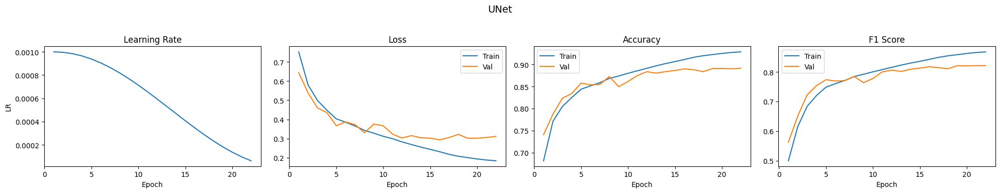


===== TEST RESULTS =====
Test Loss:      0.2992
Test Accuracy:  0.8900
Test Precision: 0.8367
Test Recall:    0.8096
Test F1-score:  0.8177
{'test_loss': 0.2992128398006441, 'test_acc': 0.8899624924076192, 'test_precision': 0.8366648517933297, 'test_recall': 0.8096454703941633, 'test_f1': 0.817723788692459}

=== Epoch 5 ===


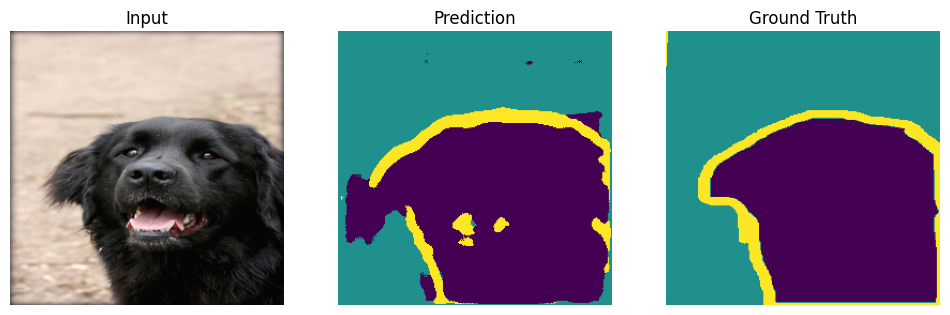

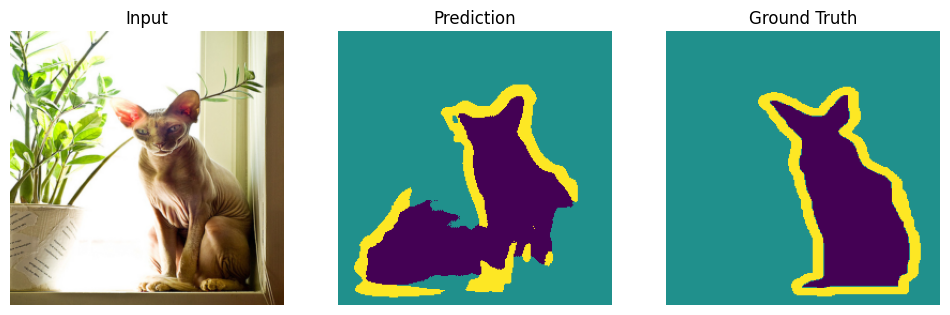

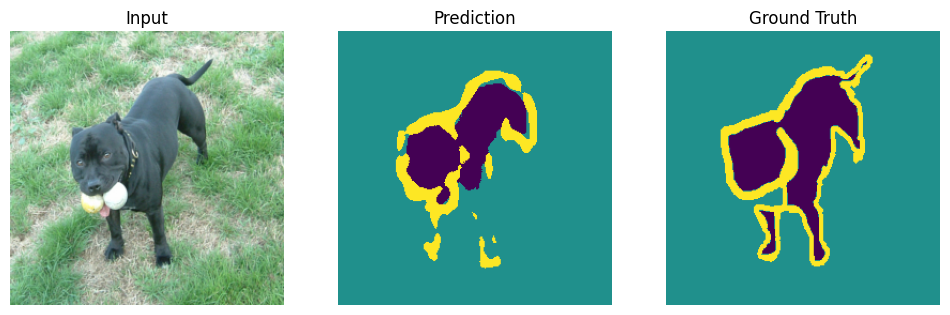


=== Epoch 10 ===


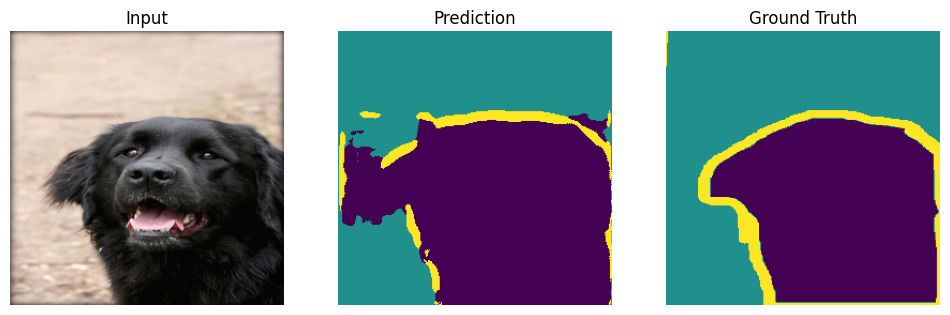

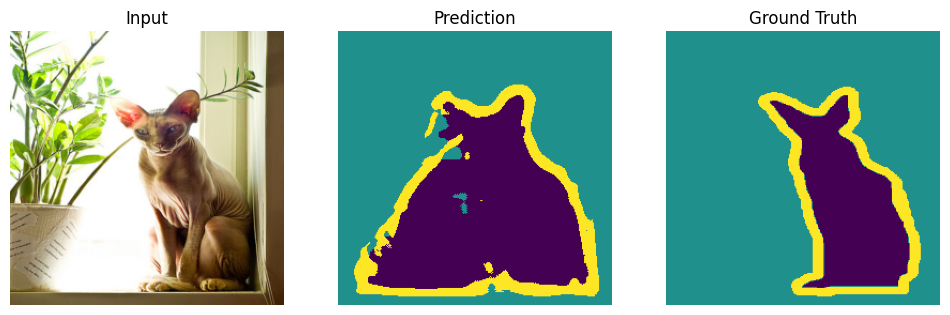

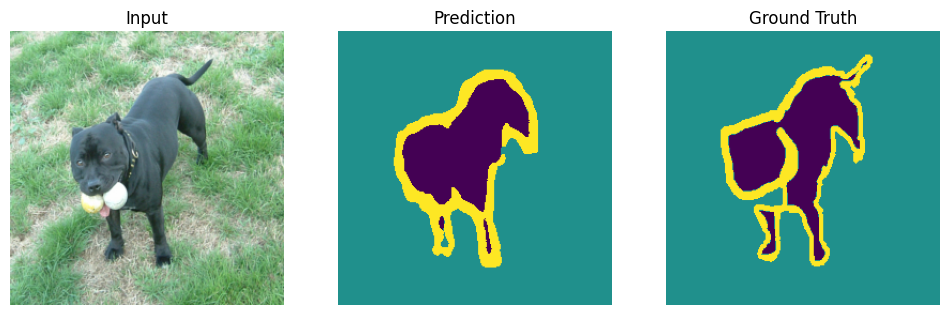


=== Epoch 15 ===


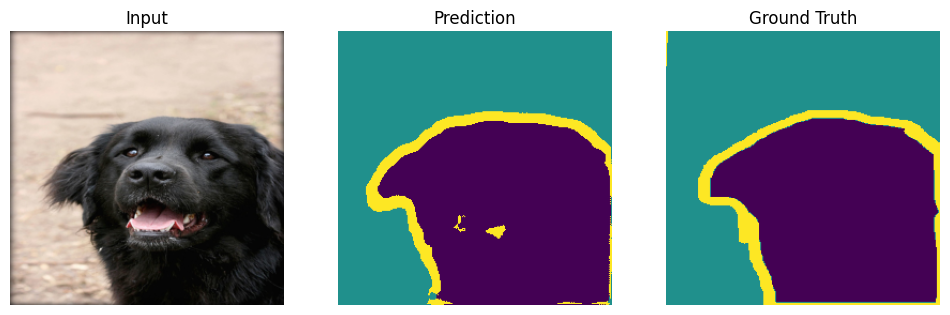

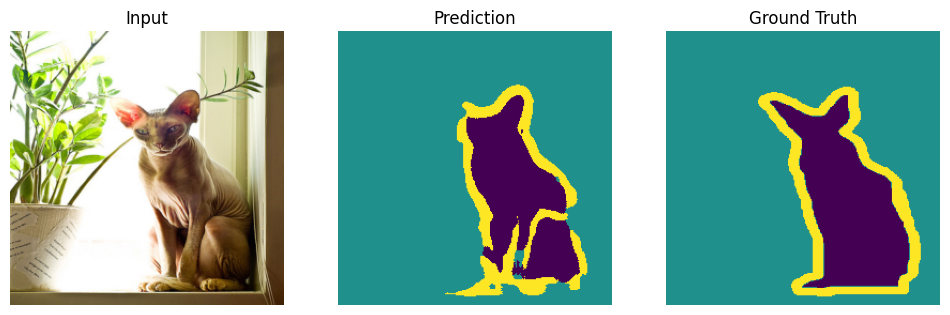

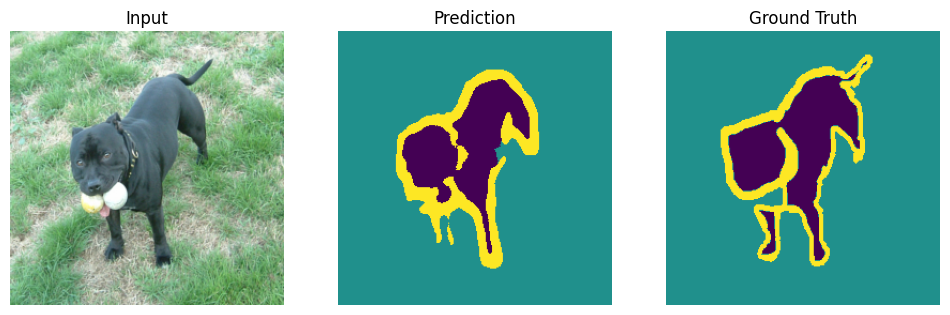


=== Epoch 20 ===


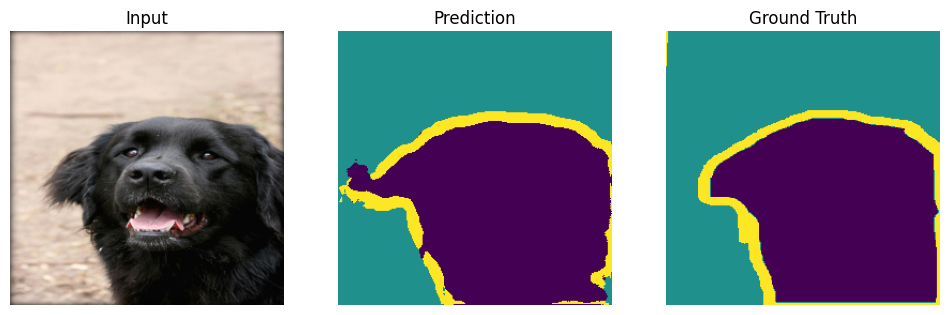

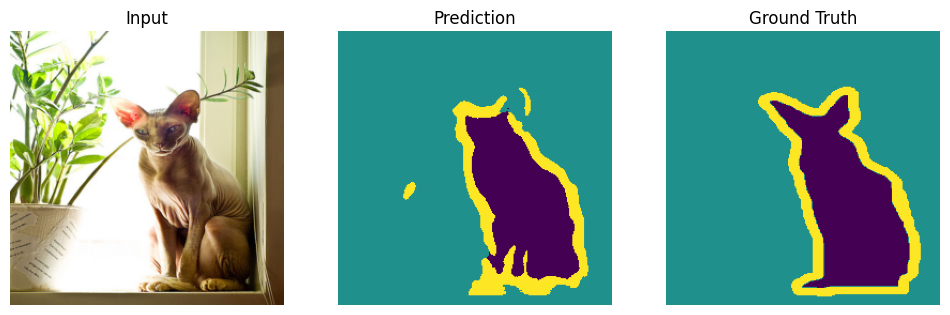

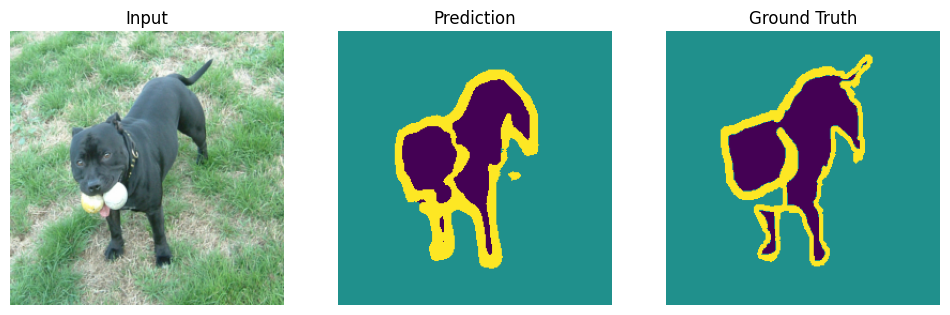

In [14]:
num_classes = 3
model = UNet(in_channels=3, num_classes=num_classes)
device = "cuda" if torch.cuda.is_available() else "cpu"

model, history = train_model_segmentation_full(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=25,
    lr=0.001,
    patience=6,
    device=device,
    use_cosine_scheduler=True,
    save_every=5,
    num_visualize=3
)

plot_history_segmentation(history, title="UNet")
test_metrics = evaluate_model_segmentation(model, test_loader, device=device)
print(test_metrics)

plot_all_visualizations()


## Autoenkoder

Autoenkoder to architektura zaliczana do uczenia nienadzorowanego (unsupervised learning), co oznacza, że trenujemy ją wyłącznie na danych wejściowych, bez udziału etykiet. Model ten składa się z połączonego enkodera i dekodera, a jego celem jest minimalizacja błędu rekonstrukcji wejścia (np. Mean Squared Error).

Matematycznie problem ten sprowadza się do znalezienia takiego zbioru parametrów θ, który minimalizuje funkcję straty: $$ L(x^{(t)}, g_{\theta}(f_{\theta}(x^{(t)}))) $$ dla *enkodera* $f$ i *dekodera* $g$. Kluczową cechą jest to, że wymiar na wyjściu enkodera jest zazwyczaj mniejszy niż danych wejściowych. Ma to na celu wymuszenie kompresji danych do tzw. przestrzeni ukrytej (latent space), co zapobiega nauczeniu się przez sieć trywialnej funkcji tożsamościowej. Dekoder zajmuje się następnie rekonstrukcją oryginalnego obrazu na podstawie tej skompresowanej reprezentacji.

Bardzo dobrą praktyką jest celowe zaszumianie danych wejściowych na etapie treningu. Działa to jak silna regularyzacja – enkoder musi wtedy nauczyć się ekstrahować najważniejsze, kluczowe cechy danych, aby być w stanie odtworzyć czysty sygnał. Tak wytrenowany autoenkoder znajduje zastosowanie głównie w tworzeniu zwartych osadzeń danych (embeddingów), które mogą zostać wykorzystane w dalszych etapach, np. w zadaniu klasyfikacji.

### Przepływ danych

1. Enkoder: zajmuje się kompresją wejściowego obrazu, zwykle do zmniejszania rozmiaru przestrzennego używamy $stride=2$ zamiast max-pooling.
2. Bottleneck: punkt największej kompresji, wykorzystuje znany już $AdaptiveAvgPool2d$ aby wymusić mały rozmiar przestrzenny (np. $2 \times 2$) do dekodowania
3. Dekoder: odbudowuje obraz z wykorzystaniem wcześniej omawianych transponowanych konwolucji.

### Funkcja straty
Wykorzystamy funkcję straty [MSE](https://docs.pytorch.org/docs/stable/generated/torch.nn.MSELoss.html#mseloss) do porównania obrazu wejściowego i zrekonstruowanego. Alternatywnie może być wykorzystane [MAE](https://docs.pytorch.org/docs/stable/generated/torch.nn.L1Loss.html) ponieważ jest mniej odporne na wartości odstające. Wartości obrazu powinny być znormalizowane, ale wyjścia sieci nie muszą być ograniczone.

## Zadanie 3.1

Zaimplementuj sieć autoenkoder. Będzie ona podobna do sieci U-Net, natomiast nie używa *skip connections* do połączenia dwóch części (ma prostszy schemat). Wyucz sieć traktując obraz wejściowy jako "labele" (pamiętamy, że jest to zadanie nienadzorowane, ale nadal potrzebujemy jakiegoś ground-truth). Wyświetl ciekawsze przykłady rekonstrukcji i zawrzyj wnioski na temat łatwości uczenia sieci i jakości zrekonstruowanych obrazów.

**Uwaga**: możecie wczytać zbiór danych do nauki na wszytkich $37$ klasach, lub tylko na klasach binarnych - dla **target_types=binary-category**. Nie ma to oczywiście znaczenia do nauki autoenkodera, ale w zadaniu 3.2 potrzebne są kategorie - być może lepiej będzie zwizualizować tylko jak przestrzeń się układa dla psów i kotów, niż dla każdej z 37 klas.

Accuracy w tym przypadku nie ma jak logować, ponieważ autoencoder to nie jest model klasyfikacyjny i nie da się sprawdzić czy model odpowiednio przewidział klasę.

In [15]:
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.layers = nn.Sequential(
            DoubleConv(3, 32, stride=2),   # 256 -> 128
            DoubleConv(32, 64, stride=2),  # 128 -> 64
            DoubleConv(64, 128, stride=2), # 64 -> 32
            DoubleConv(128, 256, stride=2) # 32 -> 16
        )

    def forward(self, x):
        return self.layers(x)



class Decoder(nn.Module):
    def __init__(self, input_size=8, target_size=256):
        super().__init__()
        min_ch = 16
        layers = []
        curr_size = input_size
        in_ch = 256

        while curr_size < target_size:
            if in_ch>min_ch:
                out_ch = max(in_ch // 2, 16)
            else:
                out_ch = min_ch
            layers.append(nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2))
            layers.append(DoubleConv(out_ch, out_ch))
            in_ch = out_ch
            curr_size *= 2

        self.upsample_path = nn.Sequential(*layers)
        self.final_conv = nn.Sequential(
            nn.Conv2d(in_ch, 3, kernel_size=1),
            nn.Tanh()
        )

    def forward(self, x):
        return self.final_conv(self.upsample_path(x))

In [16]:
class CNNAutoencoder(nn.Module): # łączymy tutaj logikę enkodera i dekodera
    def __init__(self, bottleneck_size=8):
        super().__init__()
        self.encoder = Encoder()
        self.bottleneck = nn.AdaptiveAvgPool2d((bottleneck_size, bottleneck_size))
        self.decoder = Decoder(input_size=bottleneck_size, target_size=256)

    def forward(self, x):
        x = self.encoder(x)
        x = self.bottleneck(x)
        x = self.decoder(x)
        return x
    def embeddings(self, x): # użyj tylko enkodera i zwróc spłaszczony wynik
      x = self.encoder(x)
      x = self.bottleneck(x)
      return torch.flatten(x, start_dim=1)


In [17]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

full_train_dataset = OxfordIIITPet(
    root="./data",
    split="trainval",
    target_types="binary-category",
    transform=transform,
    download=True
)


test_dataset = OxfordIIITPet(
    root="./data",
    split="test",
    target_types="binary-category",
    transform=transform,
    download=True
)


train_size = int(0.8 * len(full_train_dataset))
val_size = len(full_train_dataset) - train_size

train_dataset, val_dataset = random_split(
    full_train_dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)



train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2, pin_memory=True)
val_loader   = torch.utils.data.DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2, pin_memory=True)

test_loader   = torch.utils.data.DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)

In [18]:
def train_autoencoder(model, train_loader, val_loader, device,
                      num_epochs=20, lr=0.001, save_every=5, patience=6):

    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = {
        'train_loss': [],
        'val_loss': []
    }
    best_model_state = None

    model.to(device)
    best_val_loss = float('inf')
    epochs_no_improve = 0
    reconstructions_memory = {}

    for epoch in range(1, num_epochs + 1):
        #Trening
        model.train()
        running_loss = 0.0
        for images, _ in train_loader:
            images = images.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, images)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)

        train_loss = running_loss / len(train_loader.dataset)

        # Walidacja
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, _ in val_loader:
                images = images.to(device)
                outputs = model(images)
                loss = criterion(outputs, images)
                val_loss += loss.item() * images.size(0)

        val_loss /= len(val_loader.dataset)
        scheduler.step()

        print(f"Epoch [{epoch}/{num_epochs}] | Train Loss: {train_loss:.6f} | Val Loss: {val_loss:.6f} | LR: {optimizer.param_groups[0]['lr']:.6f}")

        # Zapis rekonstrukcji jako grid
        if epoch % save_every == 0 or epoch == 1:
            with torch.no_grad():
                sample_images, _ = next(iter(val_loader))
                sample_images = sample_images.to(device)
                recon = model(sample_images)

                n_samples = min(8, sample_images.size(0))
                # Góra to oryginały, dół to rekonstrukcje
                comparison = torch.cat([sample_images[:n_samples], recon[:n_samples]])
                # gotowy grid
                grid = torchvision.utils.make_grid(comparison, nrow=n_samples, normalize=True)
                reconstructions_memory[epoch] = grid.cpu()


        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)

        # Early Stop
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f"Early stopping at epoch {epoch}")
                break


    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    return model, reconstructions_memory, history


# Wizualizacja
def show_reconstructions(recons_mem, epoch):
    if epoch not in recons_mem:
        print(f"Brak zapisu dla epoki {epoch}")
        return

    plt.figure(figsize=(15, 6))
    plt.imshow(recons_mem[epoch].permute(1, 2, 0))
    plt.title(f"Rekonstrukcje w epoce {epoch}")
    plt.axis('off')
    plt.show()

"""
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNAutoencoder(bottleneck_size=8)
"""

'\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nmodel = CNNAutoencoder(bottleneck_size=8)\n'

In [19]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [20]:
def print_analysis(bottleneck_size, model_name, epochs=20):
    set_seed(42)
    model=CNNAutoencoder(bottleneck_size=bottleneck_size)
    _, recons_mem, history = train_autoencoder(
      model,
      train_loader=train_loader,
      val_loader=val_loader,
      device="cuda" if torch.cuda.is_available() else "cpu",
      num_epochs=20,
      lr=1e-3,
      save_every=5,
      patience=7
    )


    epochs = range(1, len(history['train_loss']) + 1)

    plt.figure(figsize=(10, 5))
    plt.plot(epochs, history['train_loss'],  label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Val Loss')

    plt.title(f'Krzywa uczenia: {model_name}')
    plt.xlabel('Epoki')
    plt.ylabel('Loss (MSE)')
    plt.legend()


    plt.show()

    i = 5
    num_epochs = len(history['train_loss'])
    while (i<=num_epochs):
        show_reconstructions(recons_mem, i)
        i+=5
    return

### Zadanie 3.2
Wyucz sieć autoeknkodera. Klasycznie loguj funkcję straty (czy będziesz logować accuracy??), oraz zbieraj rekonstrukcje dla zbioru walidacyjnego w trakcie uczenia i wyświetl jak się zmieniały w trakcie trenowania. Eksperymenty wykonaj dla różnej wielkości *bottlenecka* (np. $4, 16, 32$) i zapisz swoje obserwacje.

Epoch [1/20] | Train Loss: 0.115539 | Val Loss: 0.093892 | LR: 0.000994
Epoch [2/20] | Train Loss: 0.091823 | Val Loss: 0.081539 | LR: 0.000976
Epoch [3/20] | Train Loss: 0.088987 | Val Loss: 0.078996 | LR: 0.000946
Epoch [4/20] | Train Loss: 0.085315 | Val Loss: 0.086454 | LR: 0.000905
Epoch [5/20] | Train Loss: 0.082206 | Val Loss: 0.076728 | LR: 0.000854
Epoch [6/20] | Train Loss: 0.078561 | Val Loss: 0.071282 | LR: 0.000794
Epoch [7/20] | Train Loss: 0.075491 | Val Loss: 0.076179 | LR: 0.000727
Epoch [8/20] | Train Loss: 0.073821 | Val Loss: 0.074119 | LR: 0.000655
Epoch [9/20] | Train Loss: 0.071556 | Val Loss: 0.077269 | LR: 0.000578
Epoch [10/20] | Train Loss: 0.070416 | Val Loss: 0.069678 | LR: 0.000500
Epoch [11/20] | Train Loss: 0.068171 | Val Loss: 0.093337 | LR: 0.000422
Epoch [12/20] | Train Loss: 0.066122 | Val Loss: 0.068922 | LR: 0.000345
Epoch [13/20] | Train Loss: 0.065610 | Val Loss: 0.063077 | LR: 0.000273
Epoch [14/20] | Train Loss: 0.064012 | Val Loss: 0.068023 | 

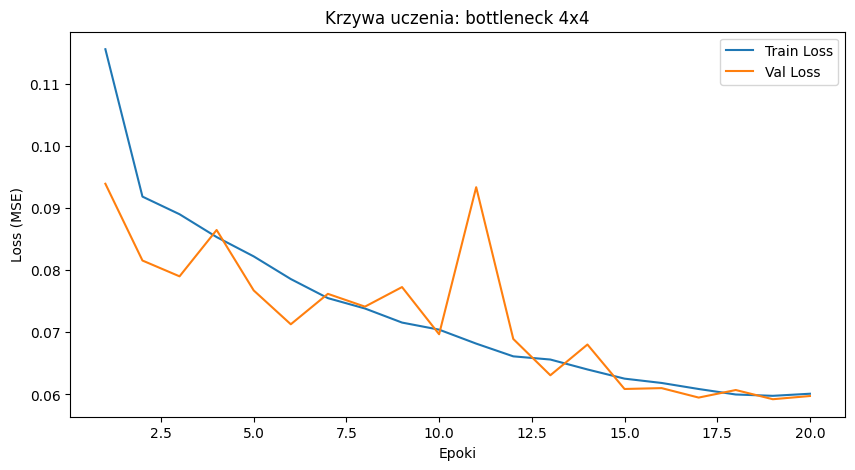

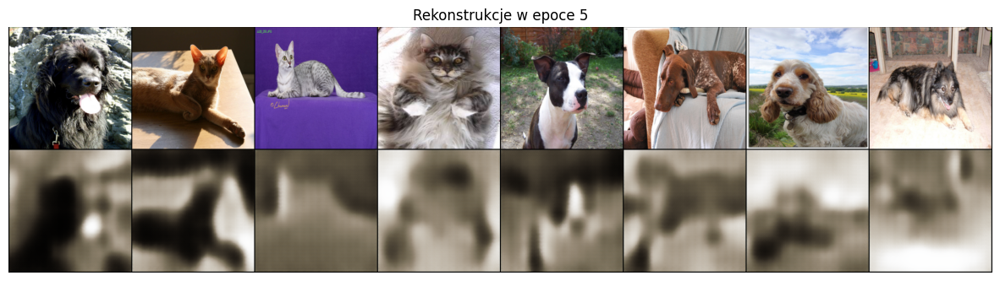

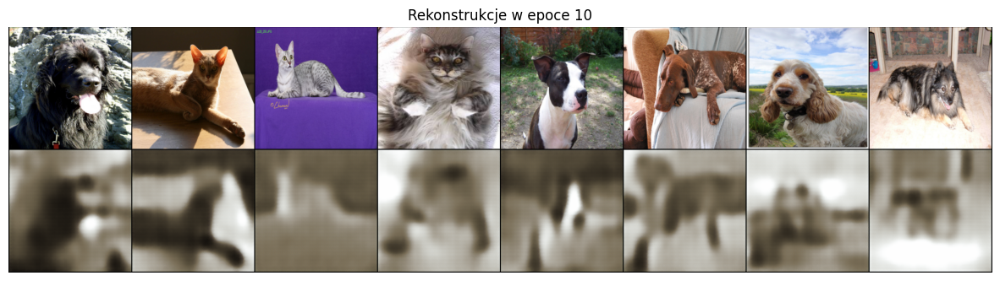

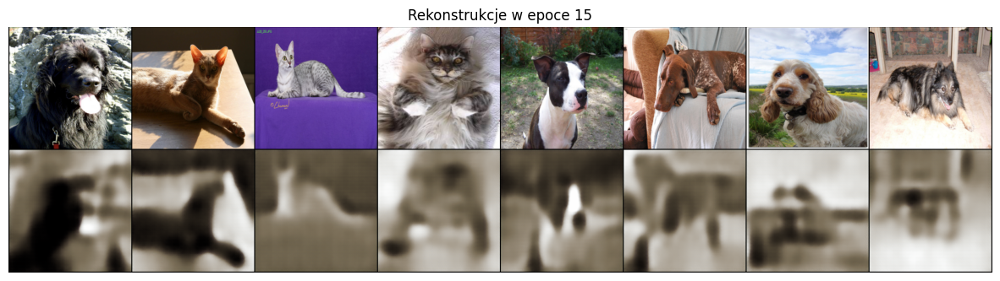

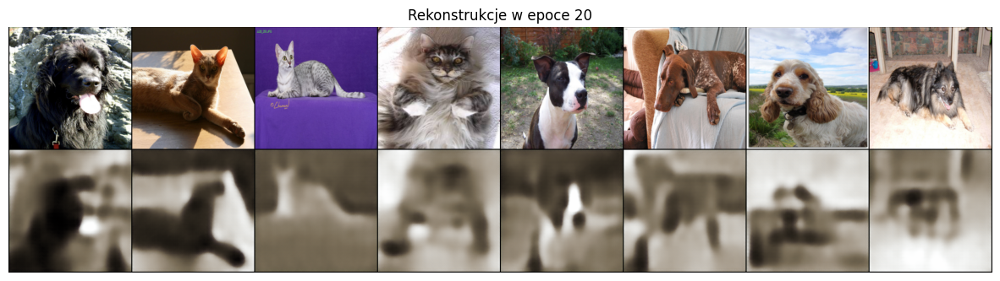

In [21]:
print_analysis(bottleneck_size=4, model_name="bottleneck 4x4")

Epoch [1/20] | Train Loss: 0.090220 | Val Loss: 0.063584 | LR: 0.000994
Epoch [2/20] | Train Loss: 0.058736 | Val Loss: 0.051254 | LR: 0.000976
Epoch [3/20] | Train Loss: 0.051950 | Val Loss: 0.057972 | LR: 0.000946
Epoch [4/20] | Train Loss: 0.049130 | Val Loss: 0.042101 | LR: 0.000905
Epoch [5/20] | Train Loss: 0.047230 | Val Loss: 0.059042 | LR: 0.000854
Epoch [6/20] | Train Loss: 0.045131 | Val Loss: 0.044057 | LR: 0.000794
Epoch [7/20] | Train Loss: 0.045296 | Val Loss: 0.040186 | LR: 0.000727
Epoch [8/20] | Train Loss: 0.043453 | Val Loss: 0.043186 | LR: 0.000655
Epoch [9/20] | Train Loss: 0.043296 | Val Loss: 0.044740 | LR: 0.000578
Epoch [10/20] | Train Loss: 0.041765 | Val Loss: 0.036882 | LR: 0.000500
Epoch [11/20] | Train Loss: 0.041079 | Val Loss: 0.043394 | LR: 0.000422
Epoch [12/20] | Train Loss: 0.038900 | Val Loss: 0.037241 | LR: 0.000345
Epoch [13/20] | Train Loss: 0.038459 | Val Loss: 0.036733 | LR: 0.000273
Epoch [14/20] | Train Loss: 0.037640 | Val Loss: 0.037637 | 

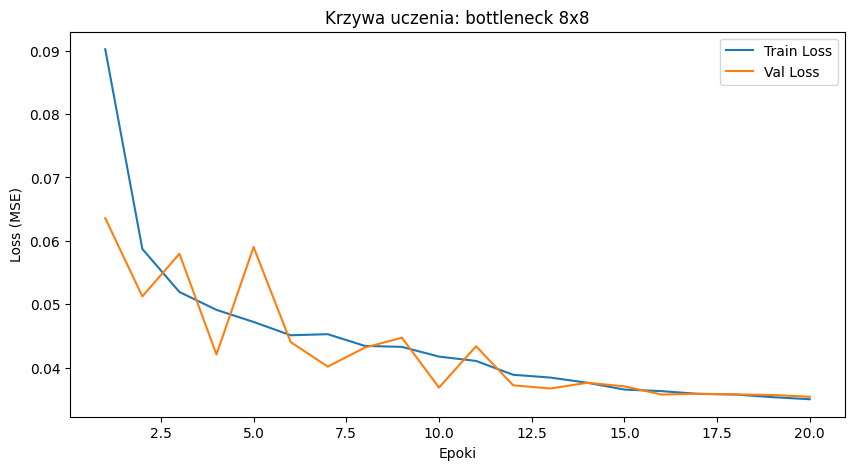

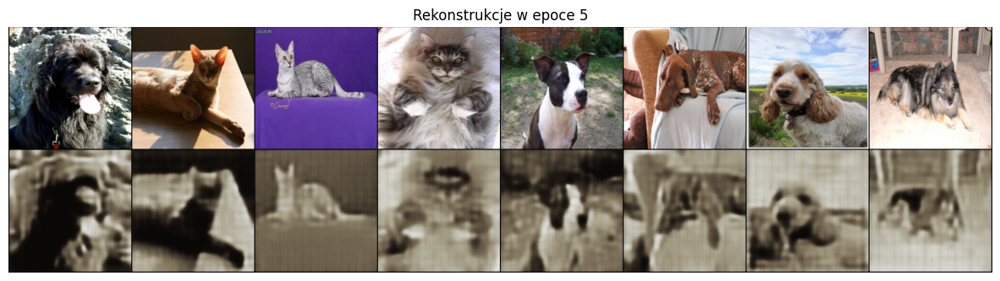

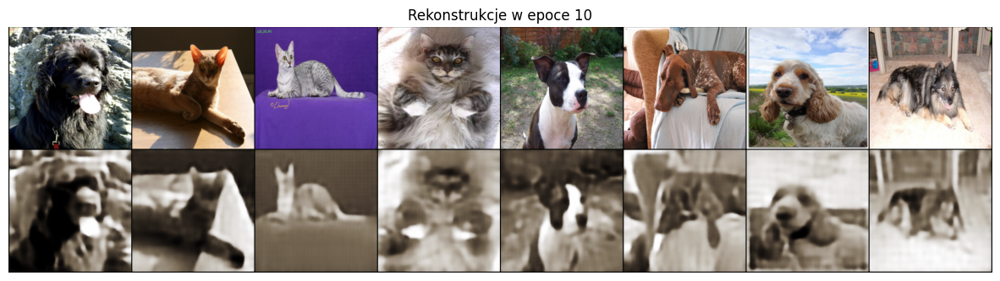

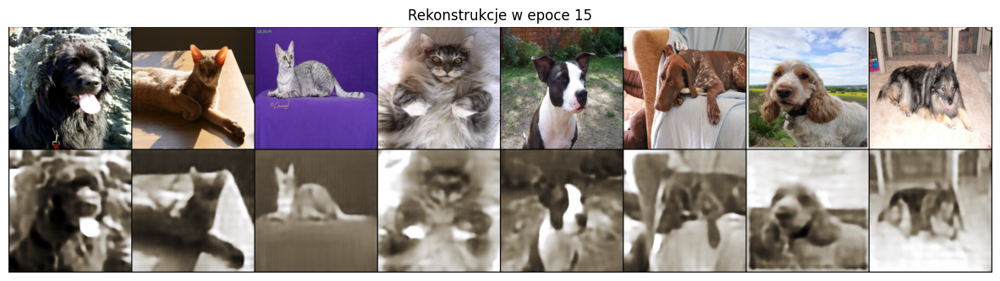

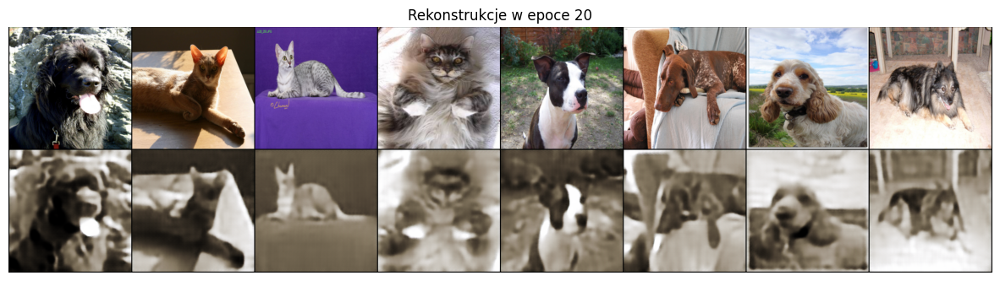

In [22]:
print_analysis(bottleneck_size=8, model_name="bottleneck 8x8")


Epoch [1/20] | Train Loss: 0.083244 | Val Loss: 0.036960 | LR: 0.000994
Epoch [2/20] | Train Loss: 0.044746 | Val Loss: 0.039091 | LR: 0.000976
Epoch [3/20] | Train Loss: 0.042186 | Val Loss: 0.046650 | LR: 0.000946
Epoch [4/20] | Train Loss: 0.041161 | Val Loss: 0.050418 | LR: 0.000905
Epoch [5/20] | Train Loss: 0.042095 | Val Loss: 0.052543 | LR: 0.000854
Epoch [6/20] | Train Loss: 0.036874 | Val Loss: 0.027818 | LR: 0.000794
Epoch [7/20] | Train Loss: 0.030211 | Val Loss: 0.026093 | LR: 0.000727
Epoch [8/20] | Train Loss: 0.027594 | Val Loss: 0.047940 | LR: 0.000655
Epoch [9/20] | Train Loss: 0.025949 | Val Loss: 0.021691 | LR: 0.000578
Epoch [10/20] | Train Loss: 0.024251 | Val Loss: 0.037037 | LR: 0.000500
Epoch [11/20] | Train Loss: 0.021614 | Val Loss: 0.028166 | LR: 0.000422
Epoch [12/20] | Train Loss: 0.019749 | Val Loss: 0.015111 | LR: 0.000345
Epoch [13/20] | Train Loss: 0.019012 | Val Loss: 0.016749 | LR: 0.000273
Epoch [14/20] | Train Loss: 0.018097 | Val Loss: 0.016841 | 

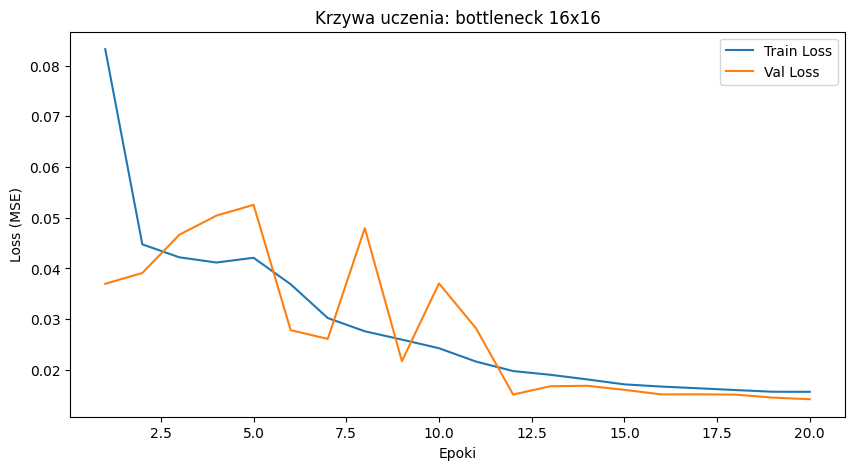

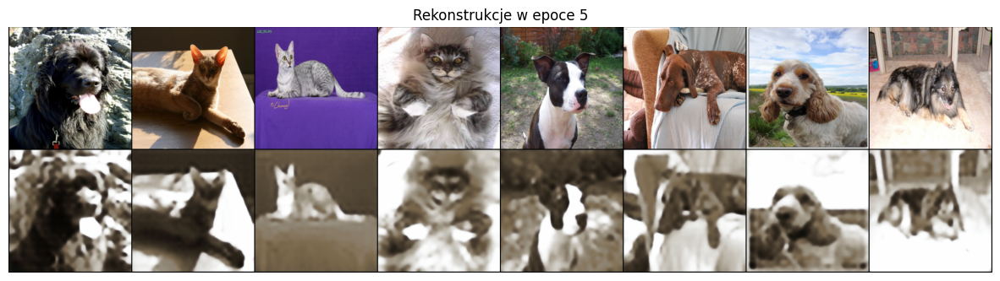

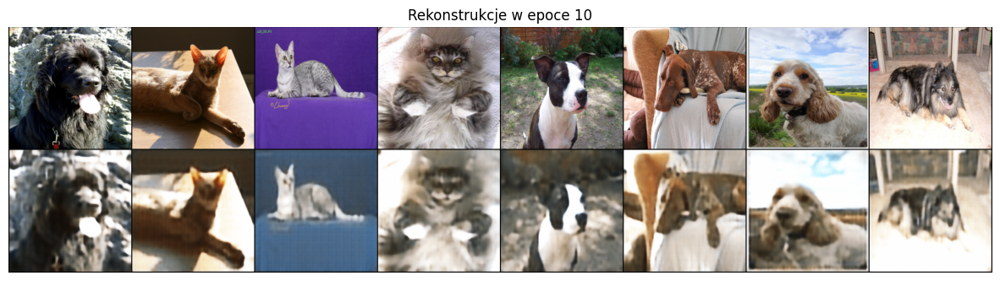

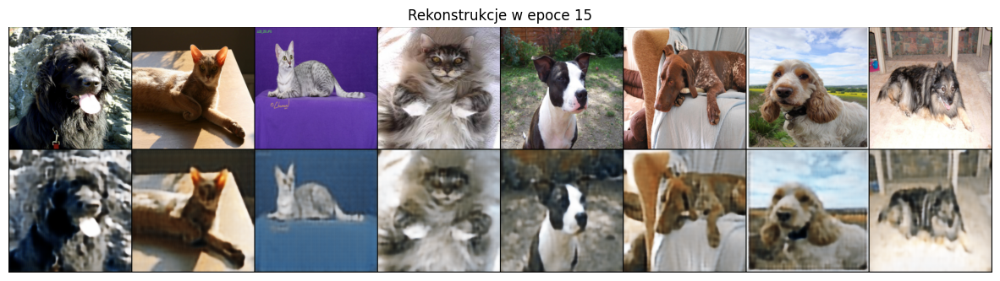

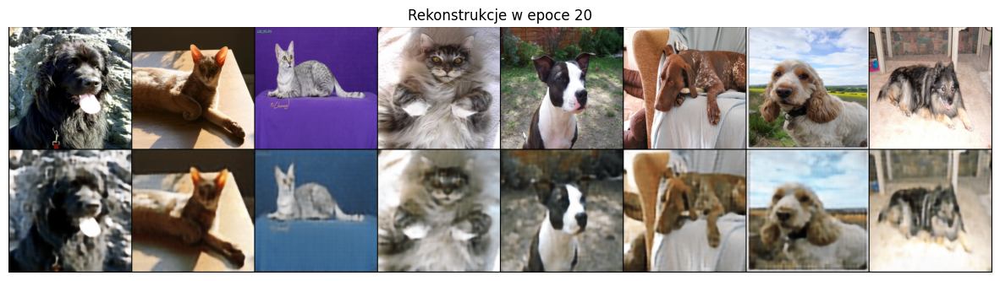

In [23]:
print_analysis(bottleneck_size=16, model_name="bottleneck 16x16")


Epoch [1/20] | Train Loss: 0.063307 | Val Loss: 0.041980 | LR: 0.000994
Epoch [2/20] | Train Loss: 0.044369 | Val Loss: 0.037410 | LR: 0.000976
Epoch [3/20] | Train Loss: 0.040324 | Val Loss: 0.041937 | LR: 0.000946
Epoch [4/20] | Train Loss: 0.037286 | Val Loss: 0.032506 | LR: 0.000905
Epoch [5/20] | Train Loss: 0.028011 | Val Loss: 0.021722 | LR: 0.000854
Epoch [6/20] | Train Loss: 0.025441 | Val Loss: 0.024066 | LR: 0.000794
Epoch [7/20] | Train Loss: 0.023685 | Val Loss: 0.024210 | LR: 0.000727
Epoch [8/20] | Train Loss: 0.022585 | Val Loss: 0.019566 | LR: 0.000655
Epoch [9/20] | Train Loss: 0.020120 | Val Loss: 0.016187 | LR: 0.000578
Epoch [10/20] | Train Loss: 0.018885 | Val Loss: 0.029924 | LR: 0.000500
Epoch [11/20] | Train Loss: 0.018675 | Val Loss: 0.015197 | LR: 0.000422
Epoch [12/20] | Train Loss: 0.017246 | Val Loss: 0.016650 | LR: 0.000345
Epoch [13/20] | Train Loss: 0.016476 | Val Loss: 0.013971 | LR: 0.000273
Epoch [14/20] | Train Loss: 0.015726 | Val Loss: 0.017068 | 

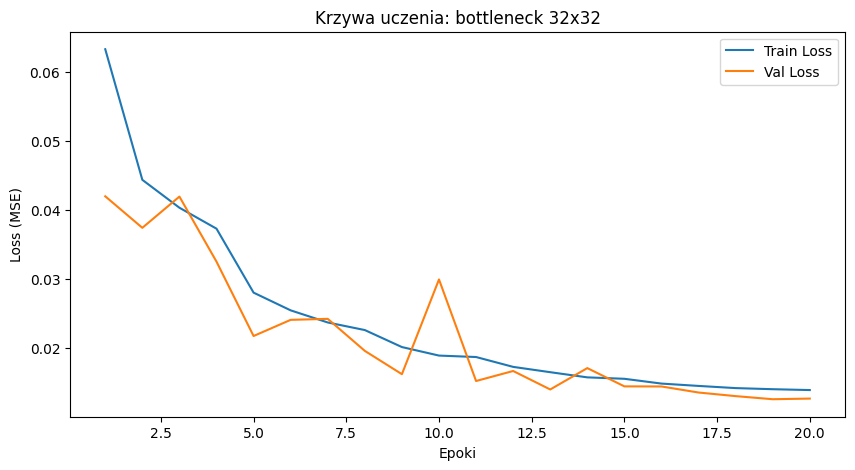

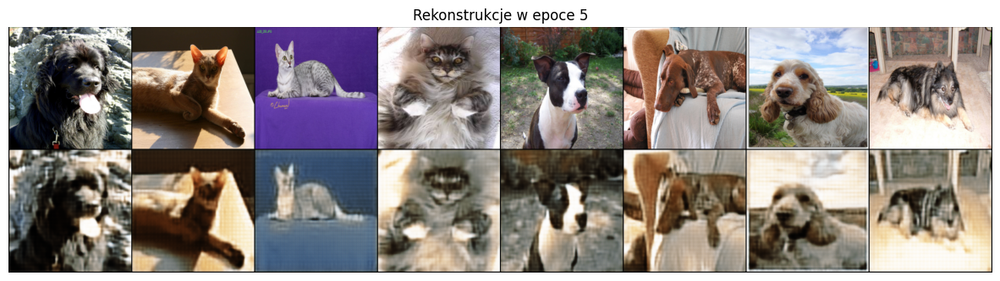

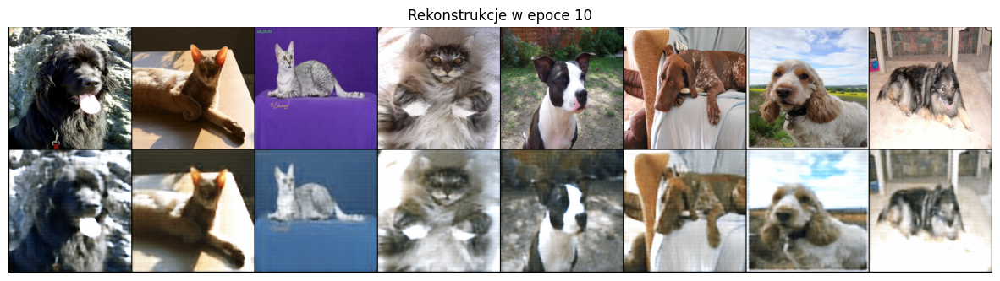

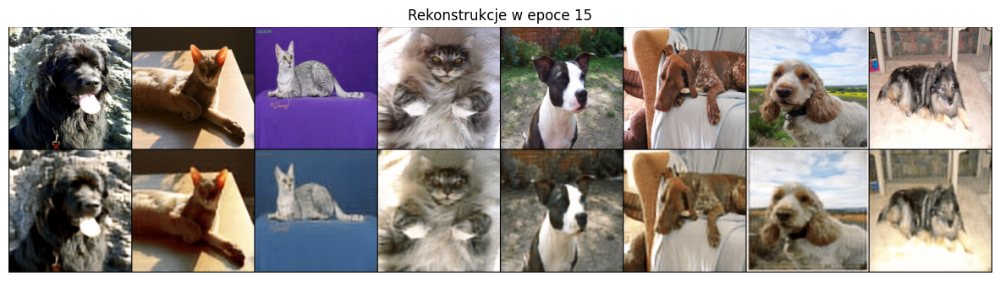

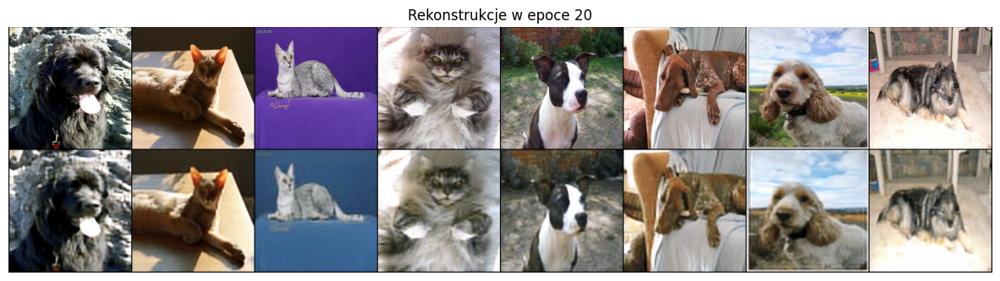

In [24]:
print_analysis(bottleneck_size=32, model_name="bottleneck 32x32")


Ogólnie im większy rozmiar bottlenecka, tym lepsza jakość rekonstrukcji i ostrzejszy obraz, co jest logiczne.

Początkowo sieć wyucza się w zasadzie tylko rozmytych kształtów, kolory są minimalne. Dopiero w późniejszych epokach obrazy faktycznie nabierają odpowiedniego koloru oraz więcej ostrości.

Modele z małym bottleneckiem nie rekonstruowały w ogóle kolorów, dopiero przy 16x16 się to zmieniło.
Poza tym modele z większym bottleneckiem osiągają zdecydowanie lepsze wyniki w zasadzie od samego początku treningu.

Dodatkowo wydaje mi się, że tła mają gorszą jakość w porównaniu do psa/kota, szczególnie dla tych mniejszych bottlenecków.

Wydaje mi się też, że bottleneck 16x16 to takie minimum żeby mieć w miarę czytelne rekonstrukcje.



## *Zadanie 3.3
Zwizualizuj wektor osadzeń przy pomocy *T-SNE*. Do tego celu potrzeba będzie spłaszczyć mapę powstałą w wyniku przejścia przez enkoder. Nie jest tutaj potrzebna sieć dekodera. Zwróć uwagę na to, czy klasy są wizualnie dobrze rozdzielone.